## 4. 위성 이미지 분류
- 텐서플로 데이터셋 로드: 인공위성 지표면 촬영 이미지, 토지이용 분류 데이터셋 이용

In [1]:
import tensorflow as tf
import numpy as np
import json
import matplotlib.pylab as plt

# Tensorflow Datasets 활용
import tensorflow_datasets as tfds

In [3]:
# EuroSAT 위성 사진 데이터셋 로드

DATA_DIR = "dataset/"

(train_ds, valid_ds), info = tfds.load('eurosat/rgb', split = ['train[:80%]','train[80%:]'],
                                       shuffle_files = True, as_supervised=True, with_info=True, data_dir = DATA_DIR)
print(train_ds)
print(valid_ds)

<_PrefetchDataset element_spec=(TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(64, 64, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [4]:
# 메타 데이터 확인
print(info)

tfds.core.DatasetInfo(
    name='eurosat',
    full_name='eurosat/rgb/2.0.0',
    description="""
    EuroSAT dataset is based on Sentinel-2 satellite images covering 13 spectral
    bands and consisting of 10 classes with 27000 labeled and
    geo-referenced samples.
    
    Two datasets are offered:
    - rgb: Contains only the optical R, G, B frequency bands encoded as JPEG image.
    - all: Contains all 13 bands in the original value range (float32).
    
    URL: https://github.com/phelber/eurosat
    """,
    config_description="""
    Sentinel-2 RGB channels
    """,
    homepage='https://github.com/phelber/eurosat',
    data_dir='dataset/eurosat/rgb/2.0.0',
    file_format=tfrecord,
    download_size=89.91 MiB,
    dataset_size=89.50 MiB,
    features=FeaturesDict({
        'filename': Text(shape=(), dtype=string),
        'image': Image(shape=(64, 64, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=10),
    }),
    supervised_keys=('image', 'l

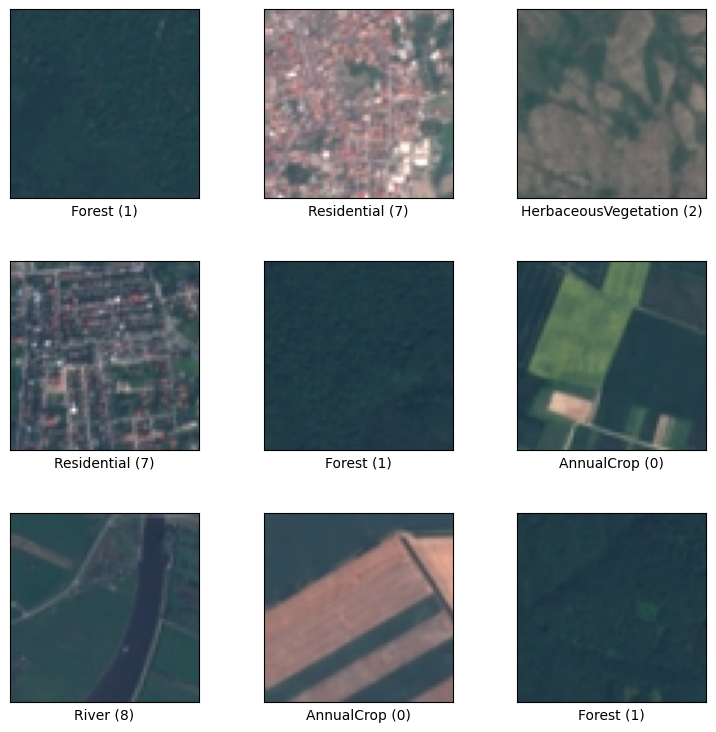

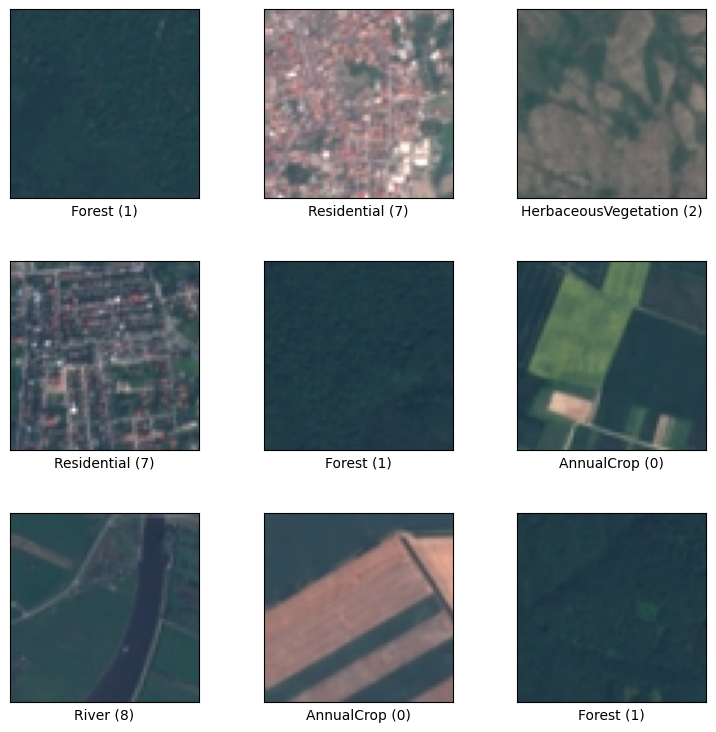

In [5]:
# 데이터 확인
tfds.show_examples(train_ds, info)

,image,label
0,,5 (Pasture)
1,,7 (Residential)
2,,0 (AnnualCrop)
3,,1 (Forest)
4,,0 (AnnualCrop)
5,,2 (HerbaceousVegetation)
6,,9 (SeaLake)
7,,8 (River)
8,,2 (HerbaceousVegetation)
9,,9 (SeaLake)

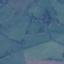
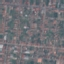
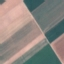
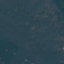
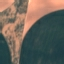
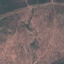
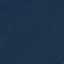
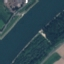
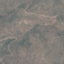
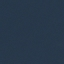

In [9]:
# as_dataframe 사용해 샘플 출력
tfds.as_dataframe(valid_ds.take(10),info)

In [10]:
# 목표 클래스 개수
NUM_CLASSES = info.features['label'].num_classes
print(NUM_CLASSES)

10


In [11]:
# 숫자 레이블을 활용해 문자열 메타 데이터로 변환
print(info.features['label'].int2str(6))

PermanentCrop


- 데이터 전처리: 텐서연산 최적화 지원

In [12]:
# 데이터 전처리 파이프라인
BATCH_SIZE = 64
BUFFER_SIZE = 1000

def preprocess_data(image, label):
  image = tf.cast(image, tf.float32)/255. # 0~1 정규화
  return image, label

train_data = train_ds.map(preprocess_data, num_parallel_calls = tf.data.AUTOTUNE)
valid_data = valid_ds.map(preprocess_data, num_parallel_calls = tf.data.AUTOTUNE)

train_data = train_data.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
valid_data = valid_data.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)

- 모델 훈련 및 검증: 배치 정규화, 합성곱, 풀링 레이어로 구성된 유닛을 2개 연결, Dense 레이어와 Dropout으로 구성된 최종 분류기 갖는 딥러닝 모델 생성

In [13]:
# Sequential API를 사용해 샘플 모델 생성

def build_model():

    model = tf.keras.Sequential([

        # Convolution 층
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.MaxPooling2D((2, 2)),

        # Classifier 출력층
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(NUM_CLASSES, activation='softmax'),
    ])
    return model

model = build_model()

In [14]:
# 모델 컴파일
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
history = model.fit(train_data, validation_data=valid_data, epochs=5)

Epoch 1/5
338/338 [==============================] - 15s 21ms/step - loss: 1.6366 - accuracy: 0.4318 - val_loss: 1.5991 - val_accuracy: 0.4667
Epoch 2/5
338/338 [==============================] - 4s 13ms/step - loss: 1.2526 - accuracy: 0.5596 - val_loss: 0.8635 - val_accuracy: 0.7102
Epoch 3/5
338/338 [==============================] - 5s 14ms/step - loss: 1.0697 - accuracy: 0.6231 - val_loss: 0.8933 - val_accuracy: 0.7098
Epoch 4/5
338/338 [==============================] - 6s 17ms/step - loss: 0.9450 - accuracy: 0.6661 - val_loss: 0.7104 - val_accuracy: 0.7604
Epoch 5/5
338/338 [==============================] - 6s 16ms/step - loss: 0.8487 - accuracy: 0.6945 - val_loss: 0.7406 - val_accuracy: 0.7470


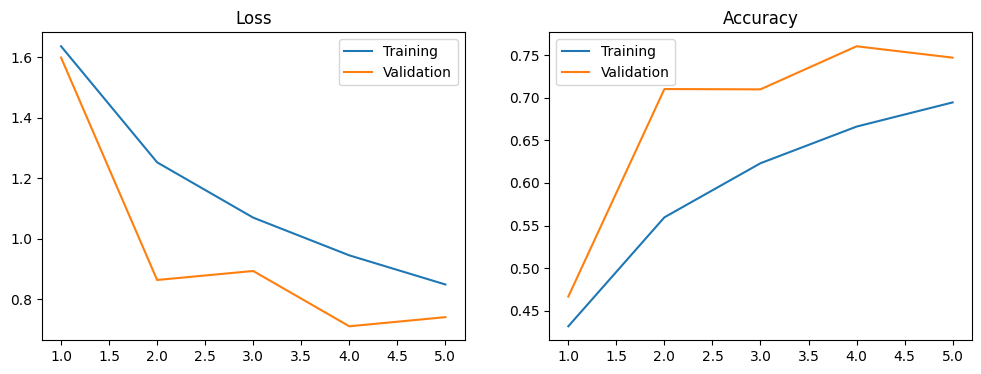

In [15]:
# 손실함수, 정확도 그래프 그리기
def plot_loss_acc(history, epoch):

    loss, val_loss = history.history['loss'], history.history['val_loss']
    acc, val_acc = history.history['accuracy'], history.history['val_accuracy']

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].plot(range(1, epoch + 1), loss, label='Training')
    axes[0].plot(range(1, epoch + 1), val_loss, label='Validation')
    axes[0].legend(loc='best')
    axes[0].set_title('Loss')

    axes[1].plot(range(1, epoch + 1), acc, label='Training')
    axes[1].plot(range(1, epoch + 1), val_acc, label='Validation')
    axes[1].legend(loc='best')
    axes[1].set_title('Accuracy')

    plt.show()

plot_loss_acc(history, 5)

- 데이터 증강(Data Augementation): 과대적합 해소하는 기법인 배치 정규화, Dropout등을 적용해도 과대적합 발생

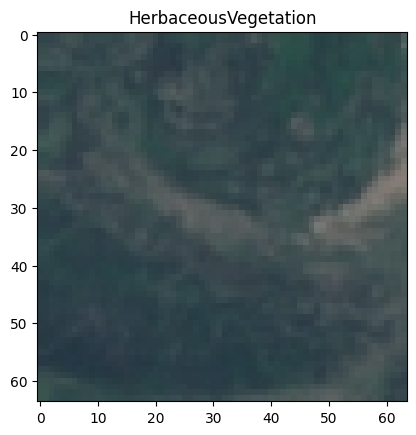

In [16]:
# 샘플 이미지
image_batch, label_batch = next(iter(train_data.take(1)))

image = image_batch[0]
label = label_batch[0].numpy()

plt.imshow(image)
plt.title(info.features["label"].int2str(label));

In [17]:
# 데이터 증강 전후를 비교하는 시각화 함수 정의
def plot_augmentation(original, augmented):

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    axes[0].imshow(original)
    axes[0].set_title('Original')

    axes[1].imshow(augmented)
    axes[1].set_title('Augmented')

    plt.show()

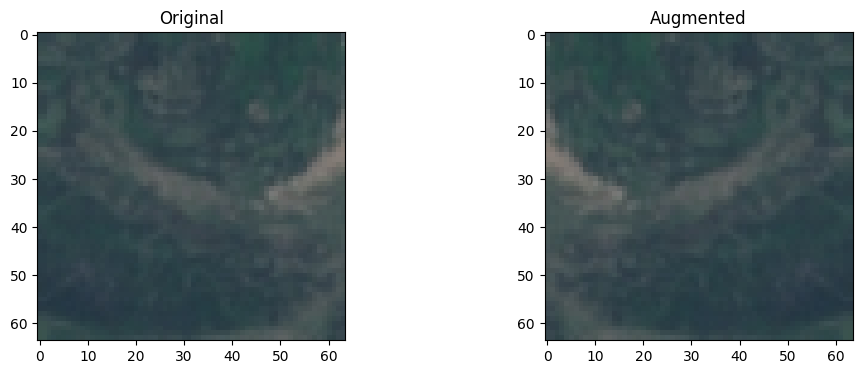

In [18]:
# 좌우 뒤집기
lr_flip = tf.image.flip_left_right(image)
plot_augmentation(image, lr_flip)

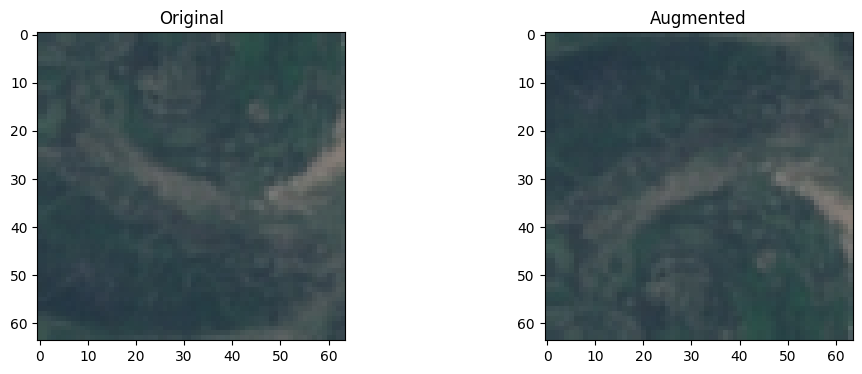

In [19]:
# 상하 뒤집기
ud_flip = tf.image.flip_up_down(image)
plot_augmentation(image, ud_flip)

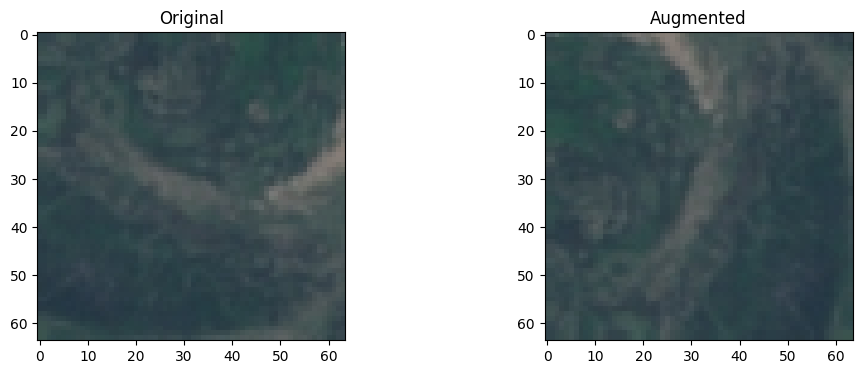

In [20]:
# 회전
rotate90 = tf.image.rot90(image)
plot_augmentation(image, rotate90)

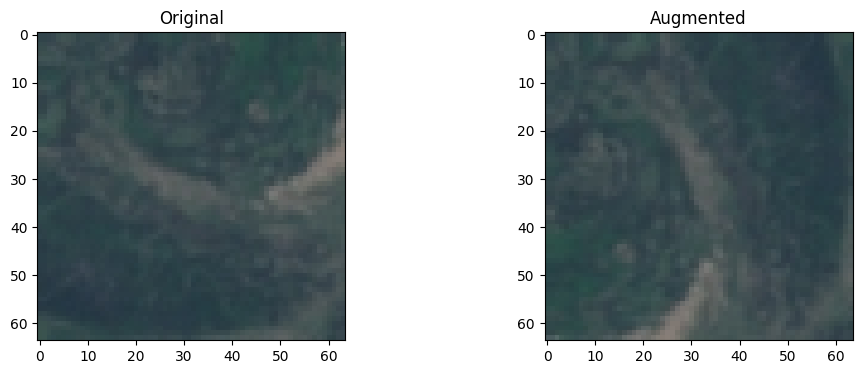

In [21]:
# transpose
transpose = tf.image.transpose(image)
plot_augmentation(image, transpose)

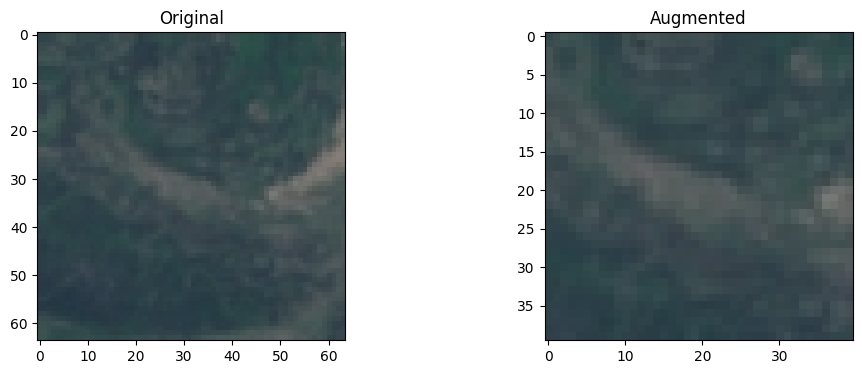

In [22]:
# 이미지 자르기 1
crop1 = tf.image.central_crop(image, central_fraction=0.6)
plot_augmentation(image, crop1)

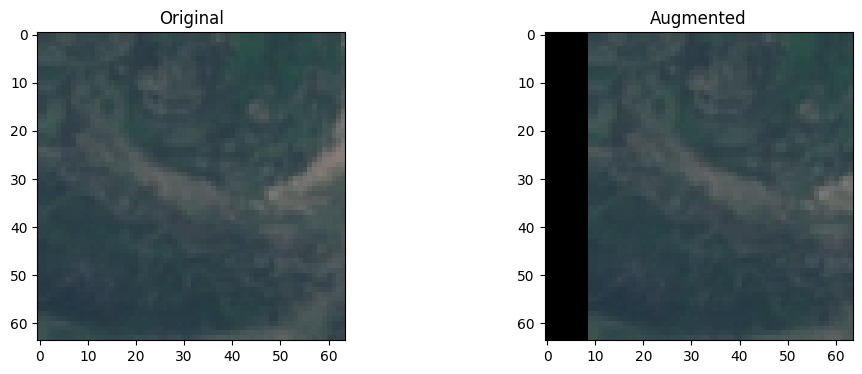

In [23]:
# 이미지 자르기 2
img = tf.image.resize_with_crop_or_pad(image, 64+20, 64+20) # 사이즈 키우기
crop2 = tf.image.random_crop(img, size=[64, 64, 3])
plot_augmentation(image, crop2)

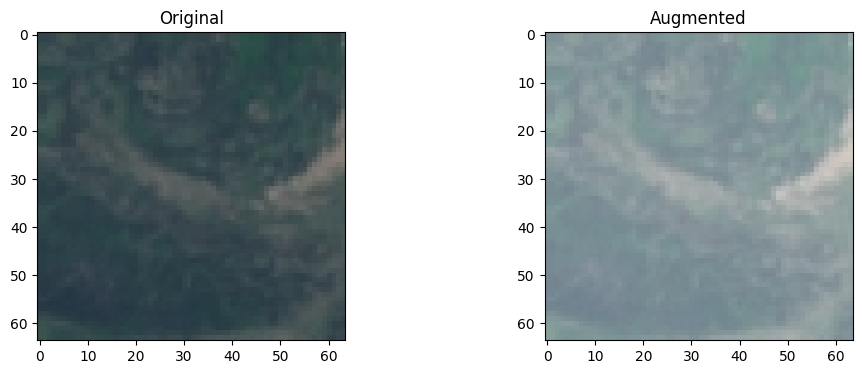

In [24]:
# 이미지 밝기
brightness = tf.image.adjust_brightness(image, delta=0.3)
plot_augmentation(image, brightness)

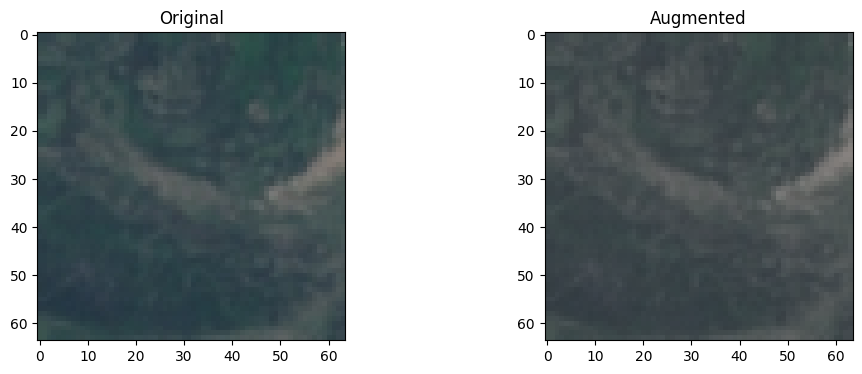

In [25]:
# 이미지 채도
saturation = tf.image.adjust_saturation(image, saturation_factor=0.5)
plot_augmentation(image, saturation)

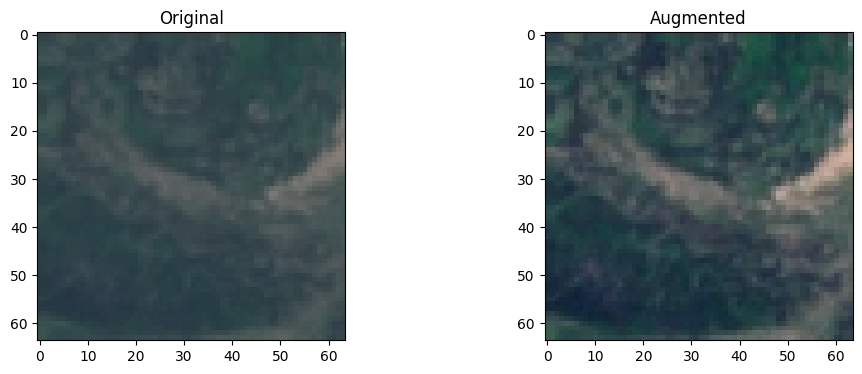

In [26]:
# 이미지 대비
contrast = tf.image.adjust_contrast(image, contrast_factor=2)
plot_augmentation(image, contrast)

In [27]:
# 이미지 증강 전처리
def data_augmentation(image, label):

    image = tf.image.random_flip_left_right(image)  # 좌우 반전
    image = tf.image.random_flip_up_down(image)  # 상하 반전
    image = tf.image.random_brightness(image, max_delta=0.3)  # 밝기 변화
    image = tf.image.random_crop(image, size=[64, 64, 3])

    image = tf.cast(image, tf.float32) / 255.  # 0~1 정규화

    return image, label

train_aug = train_ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
valid_aug = valid_ds.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)

train_aug = train_aug.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
valid_aug = valid_aug.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)

print(train_aug)
print(valid_aug)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


In [28]:
# 모델 생성
aug_model = build_model()

# 모델 컴파일
aug_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# 모델 훈련
aug_history = aug_model.fit(train_aug, validation_data=valid_aug, epochs=5)

Epoch 1/5
338/338 [==============================] - 15s 31ms/step - loss: 1.8865 - accuracy: 0.3134 - val_loss: 1.7789 - val_accuracy: 0.4035
Epoch 2/5
338/338 [==============================] - 6s 17ms/step - loss: 1.5630 - accuracy: 0.4064 - val_loss: 1.2581 - val_accuracy: 0.5709
Epoch 3/5
338/338 [==============================] - 9s 25ms/step - loss: 1.3992 - accuracy: 0.4755 - val_loss: 1.2191 - val_accuracy: 0.5567
Epoch 4/5
338/338 [==============================] - 6s 17ms/step - loss: 1.3216 - accuracy: 0.5052 - val_loss: 1.0965 - val_accuracy: 0.6222
Epoch 5/5
338/338 [==============================] - 8s 23ms/step - loss: 1.2144 - accuracy: 0.5469 - val_loss: 0.9350 - val_accuracy: 0.6620


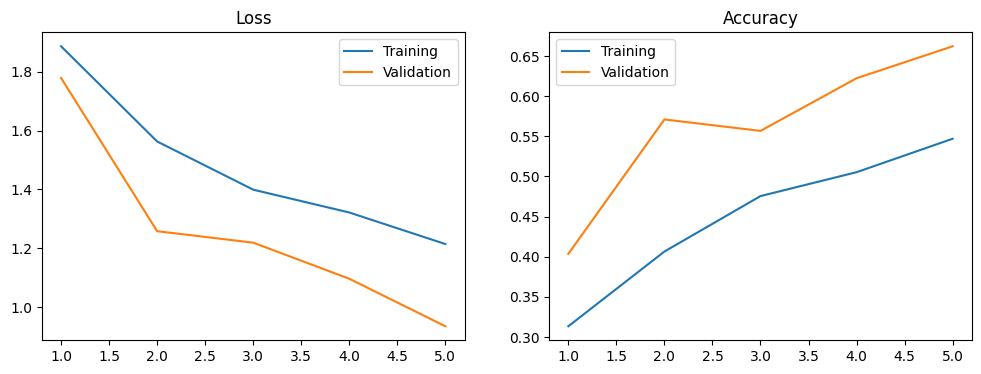

In [29]:
# 손실함수, 정확도 그래프 그리기
plot_loss_acc(aug_history, 5)

- ResNet 사전 학습 모델: 딥러닝 모델 구조와 가중치 가져와 이미지 분류하는 최종 분류기를 추가해 모델 구성

94668760/94668760 [==============================] - 3s 0us/step


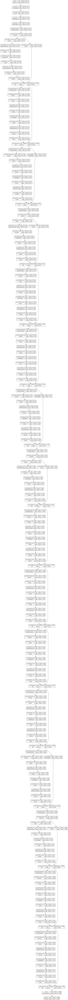

In [30]:
# Pre-trained 모델을 사전 학습된 가중치와 함께 가져오기
from tensorflow.keras.applications import ResNet50V2

pre_trained_base = ResNet50V2(include_top=False,
                               weights='imagenet',
                               input_shape=[64, 64, 3])

# 사전 학습된 가중치를 업데이트 되지 않도록 설정
pre_trained_base.trainable = False

# 모델 구조 시각화
from tensorflow.keras.utils import plot_model
plot_model(pre_trained_base, show_shapes=True, show_layer_names=True, to_file='resnet50.png')

In [31]:
# Top 층에 Classifier 추가

def build_trainsfer_classifier():

    model = tf.keras.Sequential([

        # Pre-trained Base
        pre_trained_base,
        # Classifier 출력층
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')
    ])

    return model

# 모델 구조
tc_model = build_trainsfer_classifier()
tc_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2, 2, 2048)        23564800  
                                                                 
 flatten_2 (Flatten)         (None, 8192)              0         
                                                                 
 dense_6 (Dense)             (None, 128)               1048704   
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dropout_5 (Dropout)         (None, 64)                0         
                                                                 
 dense_8 (Dense)             (None, 10)               

# Kaggle Dogs vs Cats

- Import Library

In [32]:
import numpy as np
import pandas as pd
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os
import zipfile

- Define constants

In [33]:
FAST_RUN = False
IMAGE_WIDTH=128
IMAGE_HEIGHT=128
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=3

- Prepare Training Data

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [35]:
# zip 파일 푸는 함수
def unzip_file(zip_file_path, extract_to_path):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to_path)

In [36]:
# train data 경로 설정
train_zip_path = '/content/drive/MyDrive/ESAA/train.zip'
train_extract_to_path = '/content/drive/MyDrive/ESAA/'
unzip_file(train_zip_path, train_extract_to_path)

In [37]:
# test data 경로 설정
test_file_path = '/content/drive/MyDrive/ESAA/test1.zip'
test_extract_to_path = '/content/drive/MyDrive/ESAA/'
unzip_file(test_file_path, test_extract_to_path)

In [39]:
filenames = os.listdir("/content/drive/MyDrive/ESAA/train")
categories = []
for filename in filenames:
    category = filename.split('.')[0]
    if category == 'dog':
        categories.append(1)
    else:
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

In [40]:
df.head()

,filename,category
0,cat.0.jpg,0
1,cat.1.jpg,0
2,cat.10.jpg,0
3,cat.100.jpg,0
4,cat.1000.jpg,0


In [41]:
df.tail()

,filename,category
24995,dog.9995.jpg,1
24996,dog.9996.jpg,1
24997,dog.9997.jpg,1
24998,dog.9998.jpg,1
24999,dog.9999.jpg,1


- See Total in Count

<Axes: xlabel='category'>

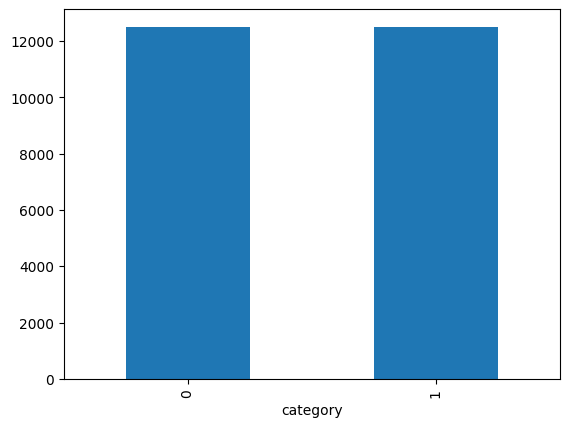

In [42]:
df['category'].value_counts().plot.bar()

- See sample image

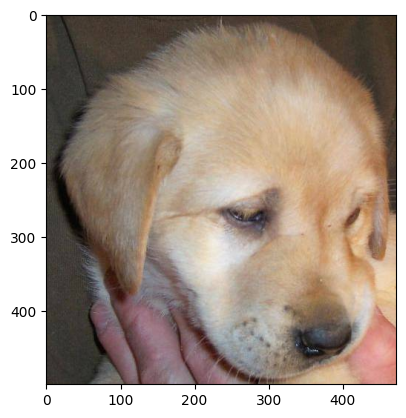

In [44]:
sample = random.choice(filenames)
image = load_img("/content/drive/MyDrive/ESAA/train/"+sample)
plt.imshow(image)

- Build Model

In [45]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax')) # 2 because we have cat and dog classes

model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 126, 126, 32)      896       
                                                                 
 batch_normalization_4 (Bat  (None, 126, 126, 32)      128       
 chNormalization)                                                
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 63, 63, 32)        0         
 g2D)                                                            
                                                                 
 dropout_6 (Dropout)         (None, 63, 63, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 batch_normalization_5 (Bat  (None, 61, 61, 64)       

- Callbacks

In [46]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

- Early Stop

In [48]:
earlystop = EarlyStopping(patience=5)

- Learning Rate Reduction

In [49]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',
                                            patience=2,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [50]:
callbacks = [earlystop, learning_rate_reduction]

- Prepare data

In [51]:
df["category"] = df["category"].replace({0: 'cat', 1: 'dog'})

In [52]:
train_df, validate_df = train_test_split(df, test_size=0.20, random_state=42)
train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

<Axes: xlabel='category'>

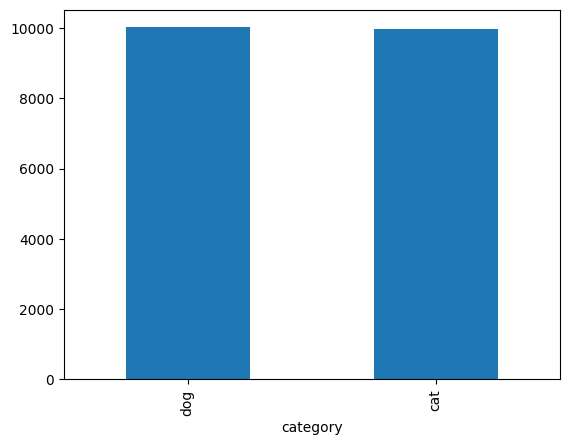

In [53]:
train_df['category'].value_counts().plot.bar()

<Axes: xlabel='category'>

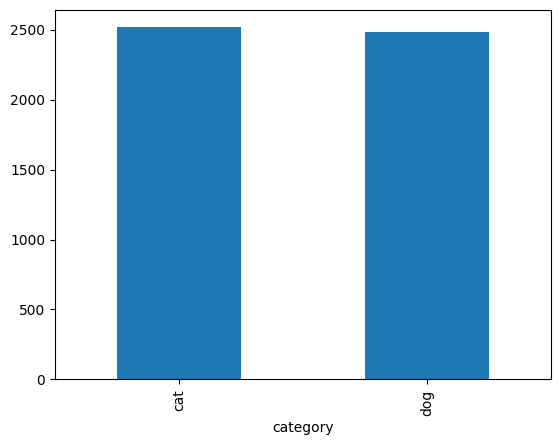

In [54]:
validate_df['category'].value_counts().plot.bar()

In [55]:
total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
batch_size=15

- Training Generator

In [56]:
train_datagen = ImageDataGenerator(
    rotation_range=15,
    rescale=1./255,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1
)

train_generator = train_datagen.flow_from_dataframe(
    train_df,
    "/content/drive/MyDrive/ESAA/train/",
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 20000 validated image filenames belonging to 2 classes.


- Validation Generator

In [57]:
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df,
    "/content/drive/MyDrive/ESAA/train/",
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=batch_size
)

Found 5000 validated image filenames belonging to 2 classes.


In [58]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen.flow_from_dataframe(
    example_df,
    "/content/drive/MyDrive/ESAA/train/",
    x_col='filename',
    y_col='category',
    target_size=IMAGE_SIZE,
    class_mode='categorical'
)

Found 1 validated image filenames belonging to 1 classes.


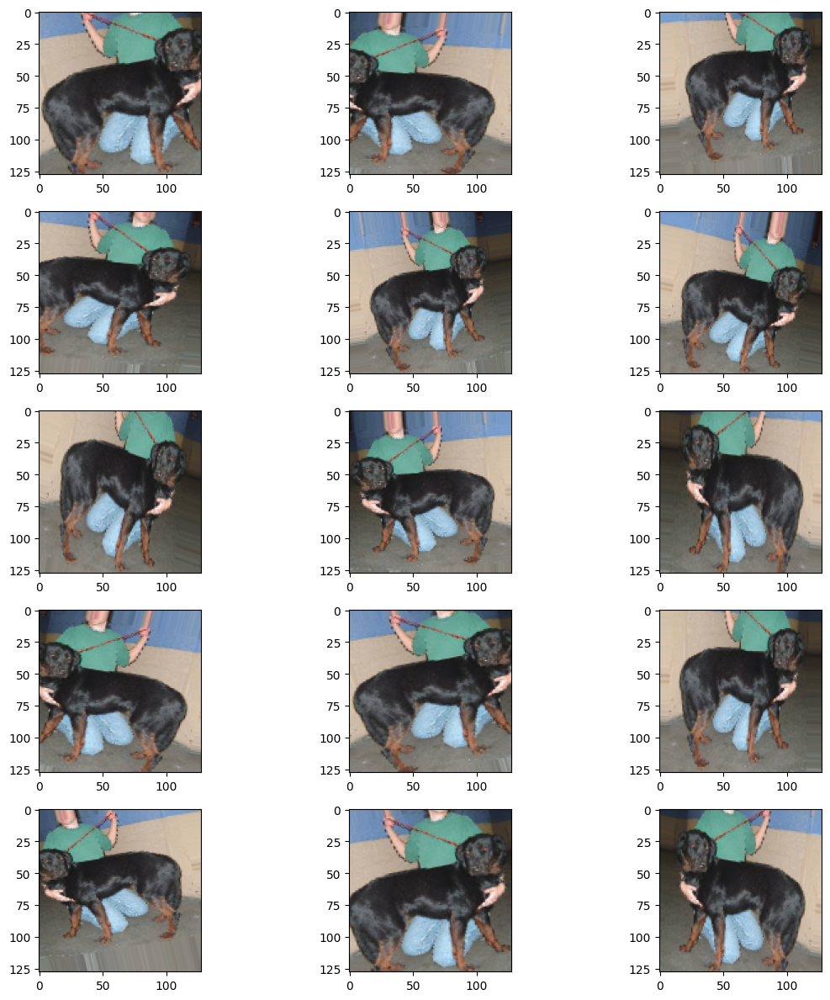

In [59]:
plt.figure(figsize=(12, 12))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

- Fit Model

In [60]:
epochs=3 if FAST_RUN else 5
history = model.fit_generator(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

<ipython-input-60-caf6f8f424f2>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/5
1333/1333 [==============================] - ETA: 0s - loss: 0.7521 - accuracy: 0.6328

1333/1333 [==============================] - 298s 220ms/step - loss: 0.7521 - accuracy: 0.6328 - val_loss: 0.5371 - val_accuracy: 0.7287 - lr: 0.0010
Epoch 2/5
1333/1333 [==============================] - ETA: 0s - loss: 0.5701 - accuracy: 0.7122

1333/1333 [==============================] - 234s 176ms/step - loss: 0.5701 - accuracy: 0.7122 - val_loss: 0.6706 - val_accuracy: 0.6701 - lr: 0.0010
Epoch 3/5
1333/1333 [==============================] - ETA: 0s - loss: 0.5102 - accuracy: 0.7612

1333/1333 [==============================] - 233s 175ms/step - loss: 0.5102 - accuracy: 0.7612 - val_loss: 0.8427 - val_accuracy: 0.6881 - lr: 0.0010
Epoch 4/5
1333/1333 [==============================] - ETA: 0s - loss: 0.4721 - accuracy: 0.7793

1333/1333 [==============================] - 251s 188ms/step - loss: 0.4721 - accuracy: 0.7793 - val_loss: 0.3804 - val_accuracy: 0.8280 - lr: 0.0010
Epoch 5/5
1333/1333 [==============================] - ETA: 0s - loss: 0.4464 - accuracy: 0.7944

1333/1333 [==============================] - 230s 173ms/step - loss: 0.4464 - accuracy: 0.7944 - val_loss: 0.8764 - val_accuracy: 0.6507 - lr: 0.0010


- Save Mode

In [61]:
model.save_weights("model.h5")

- Virtualize Training

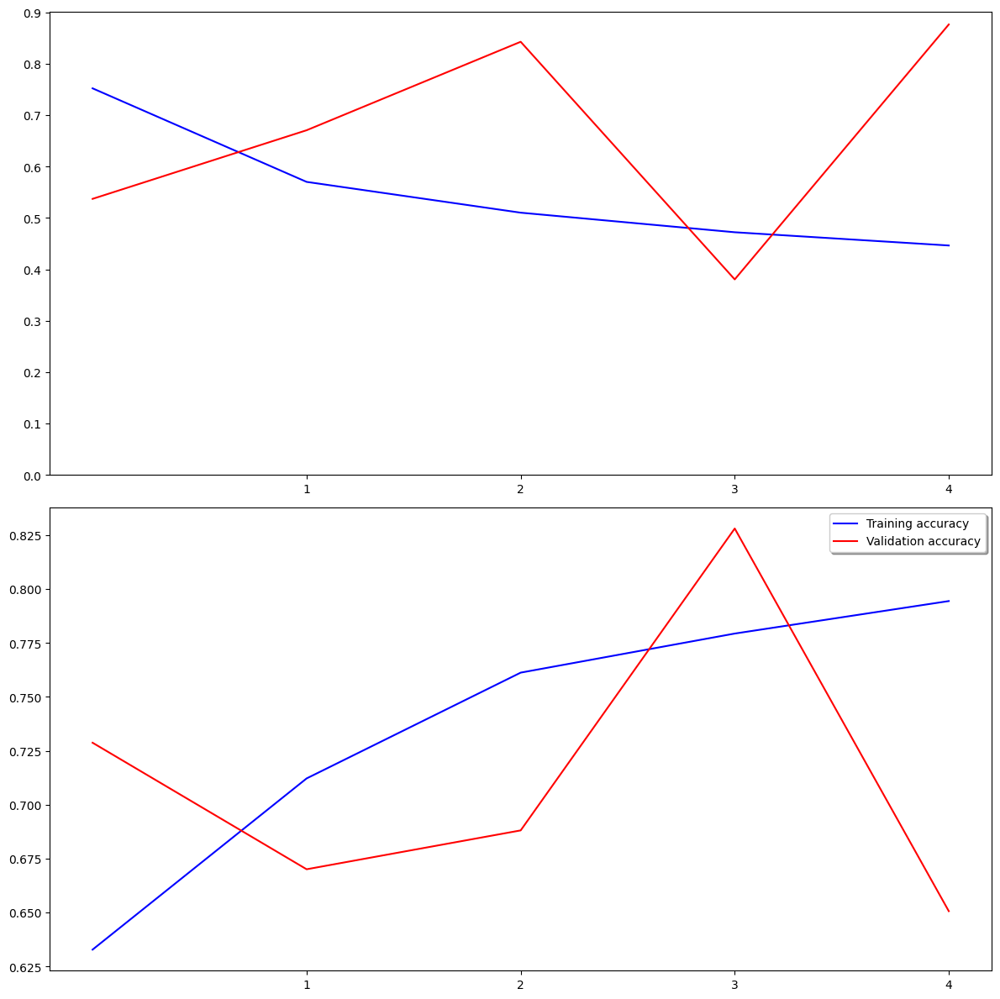

In [62]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(history.history['loss'], color='b', label="Training loss")
ax1.plot(history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, epochs, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, epochs, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

- Prepare Testing Data

In [63]:
test_filenames = os.listdir("/content/drive/MyDrive/ESAA/test1/")
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]

- Create Testing Generator

In [64]:
test_gen = ImageDataGenerator(rescale=1./255)
test_generator = test_gen.flow_from_dataframe(
    test_df,
    "/content/drive/MyDrive/ESAA/test1/",
    x_col='filename',
    y_col=None,
    class_mode=None,
    target_size=IMAGE_SIZE,
    batch_size=batch_size,
    shuffle=False
)

Found 12500 validated image filenames.


- Predict

In [65]:
predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))

<ipython-input-65-52619fd72ccc>:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  predict = model.predict_generator(test_generator, steps=np.ceil(nb_samples/batch_size))


In [66]:
test_df['category'] = np.argmax(predict, axis=-1)

In [67]:
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)

In [68]:
test_df['category'] = test_df['category'].replace({ 'dog': 1, 'cat': 0 })

- Virtualize Result

<Axes: xlabel='category'>

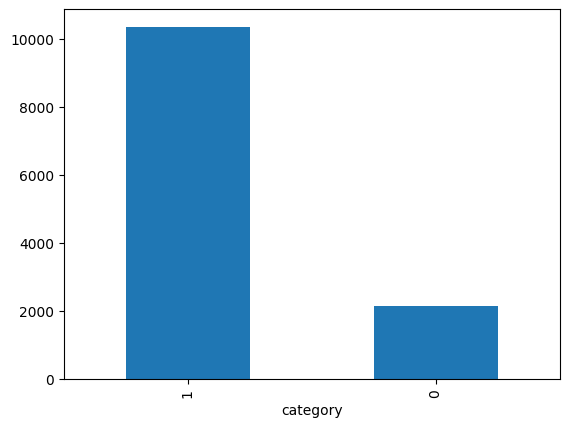

In [69]:
test_df['category'].value_counts().plot.bar()

- See predicted result with images

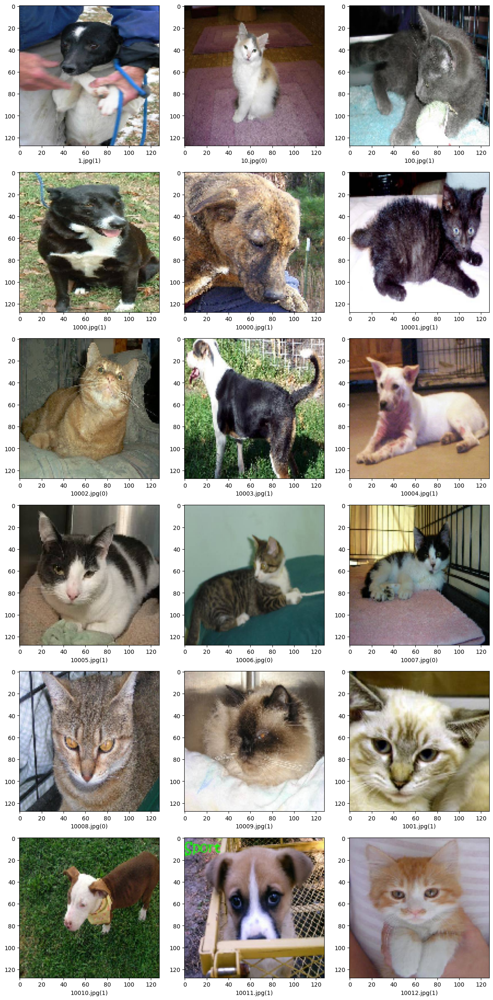

In [70]:
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("/content/drive/MyDrive/ESAA/test1/"+filename, target_size=IMAGE_SIZE)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    plt.xlabel(filename + '(' + "{}".format(category) + ')' )
plt.tight_layout()
plt.show()

- Submission

In [71]:
submission_df = test_df.copy()
submission_df['id'] = submission_df['filename'].str.split('.').str[0]
submission_df['label'] = submission_df['category']
submission_df.drop(['filename','category'], axis=1, inplace=True)